In [41]:
import pandas as pd
import numpy as np
import random
from PIL import Image

import tensorflow as tf
import keras
from keras import backend as K
from keras.layers import Dense, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.utils import to_categorical
import os
import time
from IPython import display

from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight

import matplotlib.pyplot as plt
%matplotlib inline


os.listdir('../input')

['images27638',
 'faulty_images.txt',
 'data_records_27638.txt',
 'flavours.csv',
 'metadata27368.csv']

In [13]:
# read metadata

df_meta = pd.read_csv('../input/metadata27368.csv')
#df_meta.head()

In [29]:
# import flavours

df_flav = pd.read_csv('../input/flavours.csv')
print(df_flav.columns)
flav = df_flav.values
print(flav)

Index(['Meaty', 'Sweet', 'Piquant', 'Sour', 'Salty', 'Bitter'], dtype='object')
[[   nan    nan    nan    nan    nan    nan]
 [0.8333 0.3333 0.5    0.5    0.8333 0.8333]
 [0.5    0.3333 0.     0.8333 0.3333 1.    ]
 ...
 [0.6667 0.6667 0.     0.     1.     0.6667]
 [0.5    0.8333 0.5    0.5    0.6667 1.    ]
 [   nan    nan    nan    nan    nan    nan]]


In [30]:
# import faulty images indexes

file = open("../input/faulty_images.txt", "r")
faul_id = []
for val in file.read().split():
    faul_id.append(int(val)-1)
file.close()
print(len(faul_id),"faulty images")

262 faulty images


In [31]:
# get the unlabeled images indexes

# search for nan values in flavours df
nan_bool = df_flav.isnull().any(axis=1)
nan_id = np.where(nan_bool == True)[0]
print(len(nan_id),'unlabeled images')

4886 unlabeled images


In [32]:
# remove faulty images from unlabeles

f_nan_id = []
for i in faul_id:
    t = np.where(nan_id == i)[0]
    if len(t) != 0:
        f_nan_id.append(t)
nan_id = np.delete(nan_id, f_nan_id)

print(len(nan_id),'true unlabeled images')

4827 true unlabeled images


In [33]:
# Good images !

good_id = np.arange(27638)
good_id = np.delete(good_id, np.union1d(faul_id, nan_id))

print(len(good_id))



22549


In [34]:
# Train and validation split 
train_id, val_id, _, _ = train_test_split(good_id, good_id, test_size=0.2)

print('Train', len(train_id))
print('Val',len(val_id))

Train 18039
Val 4510


In [35]:
# creat a useful dictionary structures

partition = {}
partition['train'] = train_id
partition['validation'] = val_id
partition['faulty'] = faul_id
partition['no_label'] = nan_id

labels = {}
name = {}
image = {}
for i in range(27638):
    
    labels[str(i)] = df_flav.iloc[[i]].values[0] # every label is a panda df rows
    
    name[str(i)] = df_meta['name'][i]
    
    im = str(i+1)
    while len(im) < 5 :
        im = '0' + im
    im ='img' + im + '.jpg'
    image[str(i)] = im

In [36]:
# test dictionaries

print(labels['1'])

print(name['1'])

print(image['1'])

[0.8333 0.3333 0.5    0.5    0.8333 0.8333]
Filipino BBQ Pork Skewers
img00002.jpg


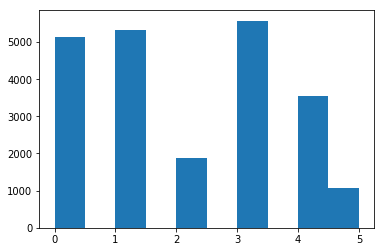

Index(['Meaty', 'Sweet', 'Piquant', 'Sour', 'Salty', 'Bitter'], dtype='object')
[0.73258609 0.70695385 1.98844797 0.67423155 1.05714955 3.46694342]


In [42]:
# Compute class distribution and class weights

c = np.argmax(flav[good_id], axis=1)

plt.hist(c)
plt.show()
print(df_flav.columns)

class_weights = class_weight.compute_class_weight('balanced',
                                                 np.unique(c),
                                                 c)
print(class_weights)

In [76]:
class DataGenerator(keras.utils.Sequence):
    #https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly 
    'Generates data for Keras'
    def __init__(self, list_IDs, labels, batch_size=32, target_size=(224, 224), n_channels=3,
                 n_classes=6, shuffle=True):
        'Initialization'
        self.target_size = target_size
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.target_size, self.n_channels))
        y = np.empty((self.batch_size, self.n_classes))

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            im = Image.open("../input/images27638/images27638/"+image[str(ID)])
            im = im.resize((224, 224), Image.ANTIALIAS)
            im.load()
            X[i] = np.asarray(im, dtype=np.uint8 )/255
            
            # class is set to highest label and convert to one-hot-encoding
            t = np.argmax(self.labels[str(ID)])
            y[i] = to_categorical(t, num_classes=6)

        return X, y

In [77]:
mobile = keras.applications.mobilenet.MobileNet()

In [78]:
mobile.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
__________

In [80]:
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Reshape
from keras.models import Model, Sequential
from keras import backend as K
# CREATE THE MODEL ARCHITECTURE

# Exclude the last 5 layers of the above model.
# This will include all layers up to and including global_average_pooling2d_1
x = mobile.layers[-6].output

predictions = Dense(6, activation='softmax')(x)

# inputs=mobile.input selects the input layer, outputs=predictions refers to the
# dense layer we created above.

model = Model(inputs=mobile.input, outputs=predictions)

In [81]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
__________

In [82]:
for i,layer in enumerate(model.layers):
    print(i,layer.name)

0 input_3
1 conv1_pad
2 conv1
3 conv1_bn
4 conv1_relu
5 conv_dw_1
6 conv_dw_1_bn
7 conv_dw_1_relu
8 conv_pw_1
9 conv_pw_1_bn
10 conv_pw_1_relu
11 conv_pad_2
12 conv_dw_2
13 conv_dw_2_bn
14 conv_dw_2_relu
15 conv_pw_2
16 conv_pw_2_bn
17 conv_pw_2_relu
18 conv_dw_3
19 conv_dw_3_bn
20 conv_dw_3_relu
21 conv_pw_3
22 conv_pw_3_bn
23 conv_pw_3_relu
24 conv_pad_4
25 conv_dw_4
26 conv_dw_4_bn
27 conv_dw_4_relu
28 conv_pw_4
29 conv_pw_4_bn
30 conv_pw_4_relu
31 conv_dw_5
32 conv_dw_5_bn
33 conv_dw_5_relu
34 conv_pw_5
35 conv_pw_5_bn
36 conv_pw_5_relu
37 conv_pad_6
38 conv_dw_6
39 conv_dw_6_bn
40 conv_dw_6_relu
41 conv_pw_6
42 conv_pw_6_bn
43 conv_pw_6_relu
44 conv_dw_7
45 conv_dw_7_bn
46 conv_dw_7_relu
47 conv_pw_7
48 conv_pw_7_bn
49 conv_pw_7_relu
50 conv_dw_8
51 conv_dw_8_bn
52 conv_dw_8_relu
53 conv_pw_8
54 conv_pw_8_bn
55 conv_pw_8_relu
56 conv_dw_9
57 conv_dw_9_bn
58 conv_dw_9_relu
59 conv_pw_9
60 conv_pw_9_bn
61 conv_pw_9_relu
62 conv_dw_10
63 conv_dw_10_bn
64 conv_dw_10_relu
65 conv_pw_10

In [83]:
# if we want to set the first 20 layers of the network to be non-trainable
for layer in model.layers[:20]:
    layer.trainable=False
for layer in model.layers[20:]:
    layer.trainable=True

In [99]:
# SAVE ENCODED LAYERS FOR LATER VISUALIZATIONS
# Input the model and a layer to encode, which can be visualized later
def encoder(model,layer):
    selection = 'conv_pw_' + str(layer)
    encoder = Model(inputs=model.input,outputs=model.get_layer(selection).output)
    #encoder.summary()
    return(encoder)

In [86]:
model.compile(Adam(lr=0.01), loss=keras.losses.categorical_crossentropy, 
              metrics=['accuracy'])

In [87]:
def train_network(network, training_generator, validation_generator, n_epoch, network_filepath):


    # lists where we will be storing values during training, for visualization purposes
    tra_losses = [] # list for training loss
    tra_accs = [] # list for training accuracy
    val_losses = [] # list for validation loss
    val_accs = [] # list for validation accuracy

    # we want to save the parameters that give the best performance on the validation set
    # therefore, we store the best validation accuracy, and save the parameters to disk
    best_validation_accuracy = 0 # best validation accuracy

    for epoch in range(n_epoch):
        st = time.time()

        # Train your network
        results = network.fit_generator(training_generator, class_weight=class_weights)

        # Get training loss and accuracy
        training_loss = results.history['loss']
        training_accuracy = results.history['acc']

        # Add to list
        tra_losses.append(training_loss)
        tra_accs.append(training_accuracy)

        # Evaluate performance (loss and accuracy) on validation set
        scores = network.evaluate_generator(validation_generator)     
        validation_loss = scores[0]
        validation_accuracy = scores[1]

        # Add to list
        val_losses.append(validation_loss)
        val_accs.append(validation_accuracy)

        # (Possibly) update best validation accuracy and save the network
        if validation_accuracy > best_validation_accuracy:
            best_validation_accuracy = validation_accuracy
            network.save(network_filepath)

        # Visualization of the learning curves
        fig = plt.figure(figsize=(10, 5))
        tra_loss_plt, = plt.plot(range(len(tra_losses)), tra_losses, 'b')
        tra_accs_plt, = plt.plot(range(len(tra_accs)), tra_accs, 'c')
        val_loss_plt, = plt.plot(range(len(val_losses)), val_losses, 'g')
        val_acc_plt, = plt.plot(range(len(val_accs)), val_accs, 'r')
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.legend([tra_loss_plt, tra_accs_plt, val_loss_plt, val_acc_plt], 
                  ['training loss', 'training accuracy', 'validation loss', 'validation accuracy'],
                  loc='center left', bbox_to_anchor=(1, 0.5))
        plt.title('Best validation accuracy = {:.2f}%'.format(100. * best_validation_accuracy))
        display.clear_output(wait=True)
        display.display(plt.gcf())
        time.sleep(.2)

In [134]:
# Define batch size.
batch_size = 64
n_epoch = 35


# Parameters
params = {'target_size': (224,224),
          'batch_size': batch_size,
          'n_classes': 6,
          'shuffle': True}

# Generators
training_generator = DataGenerator(partition['train'], labels, **params)
validation_generator = DataGenerator(partition['validation'], labels, **params)


In [91]:
file_dir = '../working//Model'
network_filepath = os.path.join(file_dir, 'best_model.h5')
os.mkdir(file_dir)

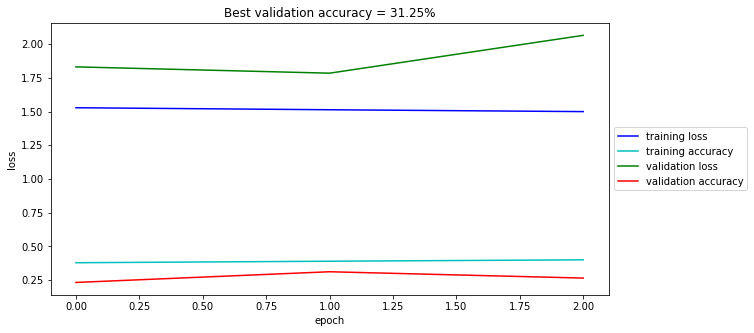

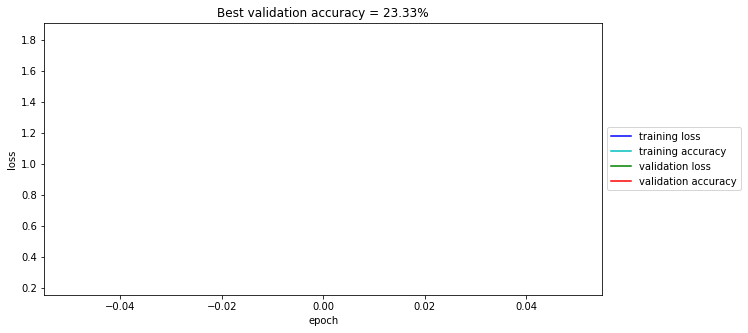

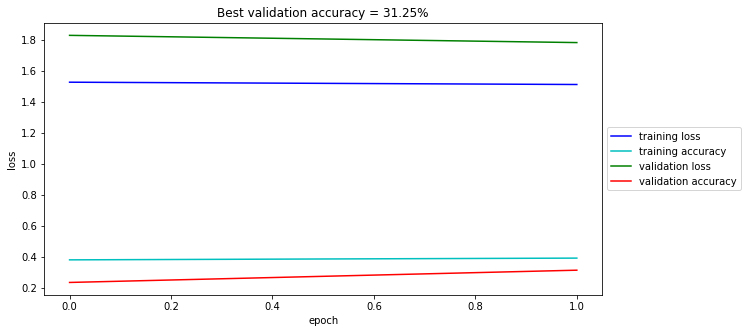

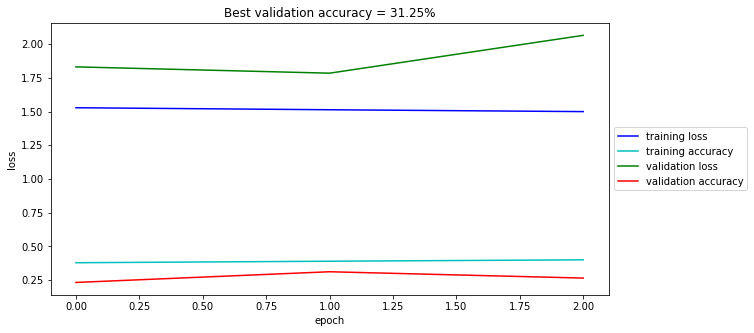

In [94]:
train_network(model, training_generator, validation_generator, n_epoch, network_filepath)

In [95]:
# Re-load the model found for the best accuracy; load_model function takes care of compiling again the function 
best_network=keras.models.load_model(network_filepath)

# Feature Visualization

In [132]:
def plot_pie_chart(model, img, labels):
    #fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))

    recipe = labels

    data = model.predict(img)[0]

    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), startangle=-40)

    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
              bbox=bbox_props, zorder=0, va="center")

    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                     horizontalalignment=horizontalalignment, **kw)

    ax.set_title("What AI sees")

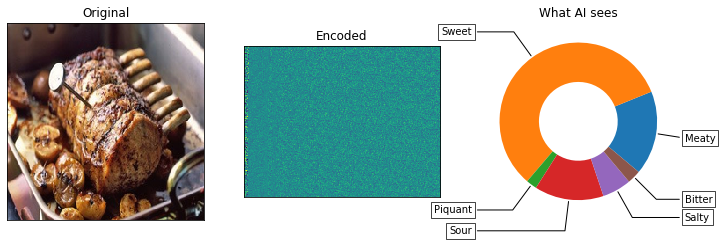

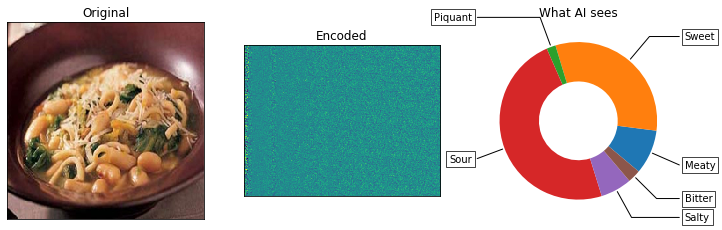

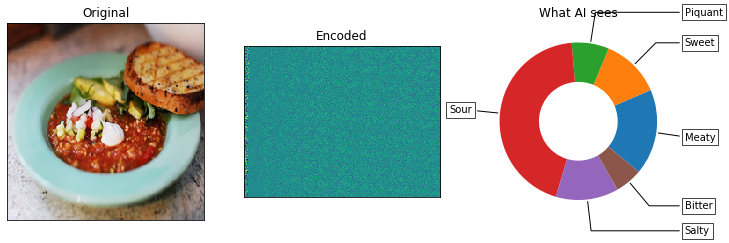

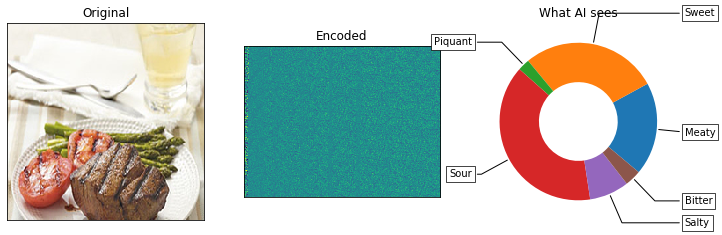

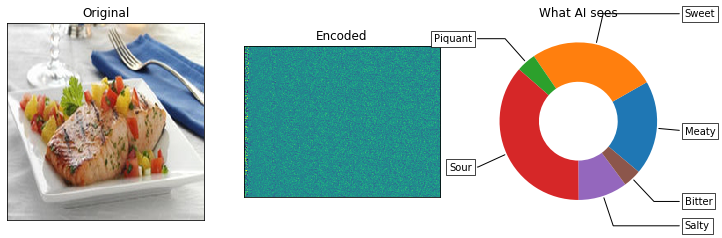

...

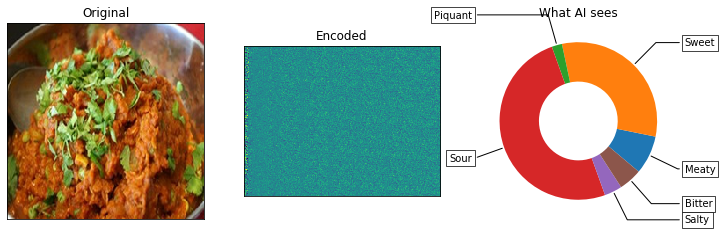

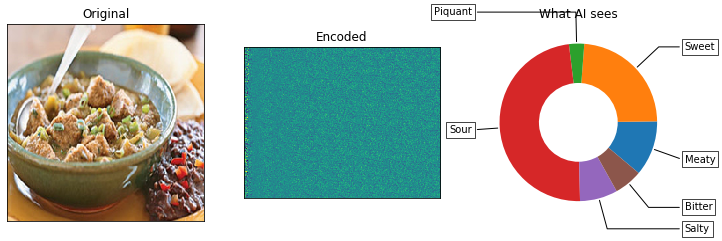

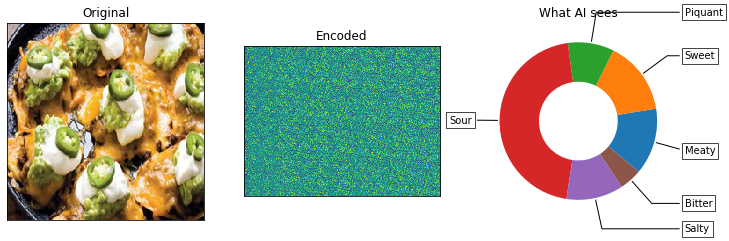

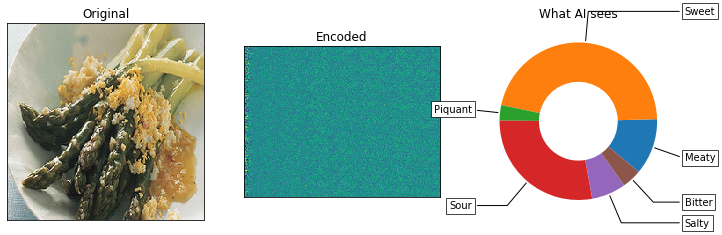

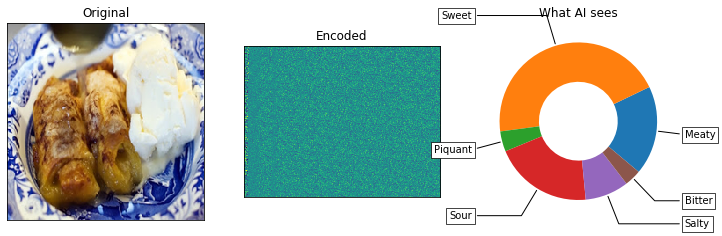

In [133]:
num_images = 50
np.random.seed(42)
random_images = random.sample(list(val_id),num_images)

encoded = encoder(best_network, 12)



for i, img_id in enumerate(random_images):
    
    plt.figure(figsize=(12,12))
    
    #Load in example image
    im = Image.open("../input/images27638/images27638/"+image[str(img_id)])
    im = im.resize((224, 224), Image.ANTIALIAS)
    im.load()
    im = np.asarray(im, dtype=np.uint8)/255

    #Plot original image
    ax = plt.subplot(1, 3, 1)
    plt.imshow(im)
    plt.title('Original')
    im = np.expand_dims(im, axis=0)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    #[LORENZO] HERE WE WANT TO VISUALIZE THE ENCODED LAYERS
    #Plot encoded image ("what the AE sees")
    ax = plt.subplot(1, 3, 2)
    encoded_img = encoded.predict(im)
    #This is still from the autoencoder so we have to reshape differently
    #To plot the image we need to know the dimension of that layer
    #This can be found by multiplication e.g. 
    #conv_pw_12 (Conv2D)  (None, 7, 7, 1024)    = 7*7*1024 = 50,176 dimensions
    #We need to reshape the image to fit this dimension e.g. 256 x 196 = 50,176 
    plt.imshow(encoded_img.reshape(256, 196).T)
    plt.title('Encoded')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    #Plot decoded image ("what the AE reconstructed")
    ax = plt.subplot(1, 3, 3)
    plot_pie_chart(best_network, im, df_flav.columns)
    plt.show()
